## DUSt3R and 3DGS

### In this notebook we will try train a neural network to map images to a 3D point cloud. For this purpose, we are going to use 'DUSt3R: Geometric 3D Vision Made Easy' implementation. We will train and analyze DUSt3R, to understand the working of an SOTA image-to-3D model.  

### Why DUSt3R:
There are man methods which address this kind of problem in 3D Vision as shown in the image:

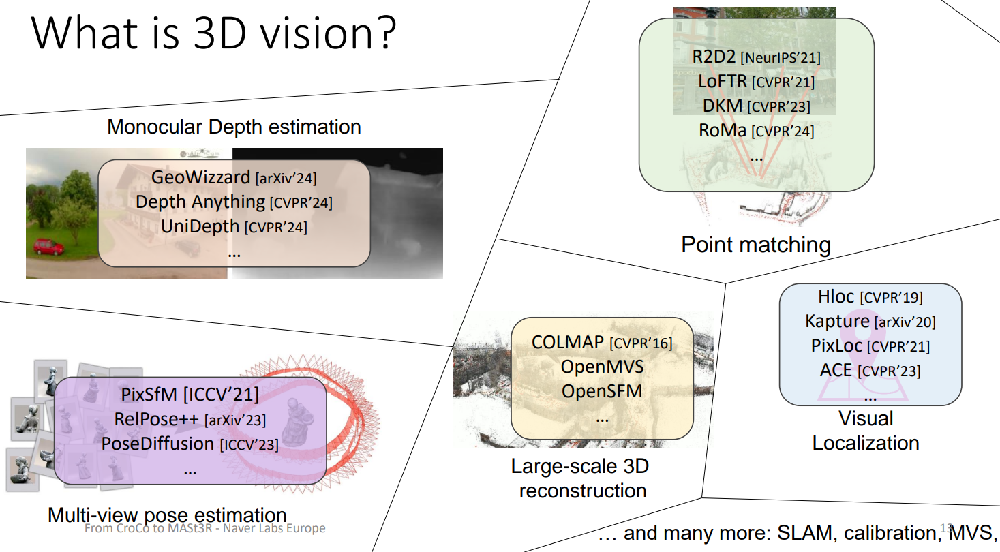

But we are interested in mapping images to 3D point cloud basically dense 3D reconstruction. For this there are many RGB-to-3D solutions based on the
idea of building a differentiable SfM pipeline but they require camera parameters and then they output depthmap and a relative camera pose. 

On the other hand DUSt3R outputs pointmaps which are basically dense 2D fields of 3D points, which handle camera poses implicitly without requiring any camera
intrinsic parameters.

### Architecture of DUSt3R:

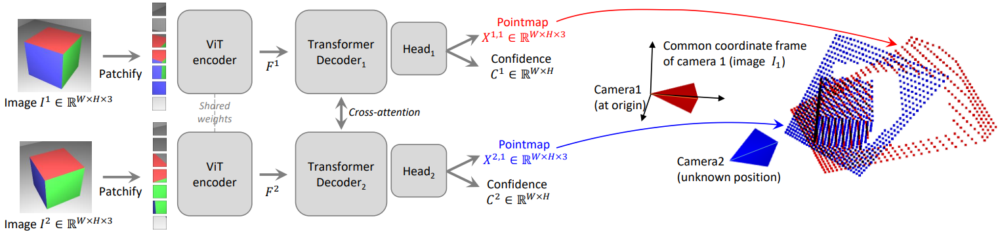

Two views of a scene are first encoded in a Siamese manner with a shared ViT encoder.
The resulting token representations are then passed to two transformer decoders that constantly exchange information via cross-attention. 
Finally, two regression heads output the two corresponding pointmaps and associated confidence maps. 
Importantly, the two pointmaps are expressed in the same coordinate frame of the first image. The network is trained using a simple regression loss. 

### Training DUSt3R

Authors train DUSt3R in 3 stages:
- step 1 - train dust3r for 224 resolution, then
- step 2 - train dust3r for 512 resolution, and then
- step 3 - train dust3r for 512 resolution with dpt

### Evaluation Metrics

- Authors compare pose estmated by DUSt3R agianst SOTA method like RelPose
- They use Relative Rotation Accuracy (RRA) and Relative Translation Accuracy (RTA) for each image pair to evaluate the relative pose error and select a threshold τ = 15 to report RTA@15 and RRA@15. 
- They also report mean Average Accuracy (mAA)@30, defined as the area under the curve accuracy of the angular differences at min(RRA@30, RTA@30).


### My attempts at training DUSt3R from scratch 

I tried training DUSt3R from scratch using (co3d) dataset but becuase of no computational resources at hand I am not able to train the models to full extent.  
I managed to train DUSt3R for 224 resolution, for 5 epochs with batch size of 2, on google colab with T4 gpu.   
At some point I stopped trying as it is not possible to train DUSt3R with resources from google colab.

In [11]:
#Clone Repo
%cd /PKN/study_projects/cvg_bern/task_2
!git clone --recursive https://github.com/naver/dust3r
%cd /PKN/study_projects/cvg_bern/task_2/dust3r

[WinError 3] The system cannot find the path specified: '/PKN/study_projects/cvg_bern/task_2'
e:\study_projects\cvg_bern\task_2\co3d
Submodule path 'croco': checked out '743ee71a2a9bf57cea6832a9064a70a0597fcfcb'
[WinError 3] The system cannot find the path specified: '/PKN/study_projects/cvg_bern/task_2/dust3r'
e:\study_projects\cvg_bern\task_2\co3d


Cloning into 'dust3r'...
Submodule 'croco' (https://github.com/naver/croco) registered for path 'croco'
Cloning into 'E:/study_projects/cvg_bern/task_2/co3d/dust3r/croco'...


In [12]:
%cd /PKN/study_projects/cvg_bern/task_2/dust3r
#Setup Environment
%pip install -r requirements.txt

[WinError 3] The system cannot find the path specified: '/PKN/study_projects/cvg_bern/task_2/dust3r'
e:\study_projects\cvg_bern\task_2\co3d
     ---------------------------------------- 0.0/1.4 MB ? eta -:--:--
      --------------------------------------- 0.0/1.4 MB 330.3 kB/s eta 0:00:05
     -- ------------------------------------- 0.1/1.4 MB 653.6 kB/s eta 0:00:03
     ------ --------------------------------- 0.2/1.4 MB 1.8 MB/s eta 0:00:01
     ---------- ----------------------------- 0.4/1.4 MB 2.0 MB/s eta 0:00:01
     -------------- ------------------------- 0.5/1.4 MB 2.3 MB/s eta 0:00:01
     ------------------ --------------------- 0.6/1.4 MB 2.5 MB/s eta 0:00:01
     --------------------- ------------------ 0.8/1.4 MB 2.6 MB/s eta 0:00:01
     ------------------------- -------------- 0.9/1.4 MB 2.7 MB/s eta 0:00:01
     ---------------------------- ----------- 1.0/1.4 MB 2.7 MB/s eta 0:00:01
     --------------------------------- ------ 1.2/1.4 MB 2.8 MB/s eta 0:00:01
     

### Lets create a dataset (co3d)

In [13]:
# download and prepare the co3d subset
!mkdir -p /PKN/study_projects/cvg_bern/task_2/data/co3d_subset
%cd /PKN/study_projects/cvg_bern/task_2/data/co3d_subset
!git clone https://github.com/facebookresearch/co3d
%cd co3d
!python3 ./co3d/download_dataset.py --download_folder ../ --single_sequence_subset


[WinError 3] The system cannot find the path specified: '/PKN/study_projects/cvg_bern/task_2/data/co3d_subset'
e:\study_projects\cvg_bern\task_2\co3d


The syntax of the command is incorrect.


e:\study_projects\cvg_bern\task_2\co3d\co3d


fatal: destination path 'co3d' already exists and is not an empty directory.
Python was not found; run without arguments to install from the Microsoft Store, or disable this shortcut from Settings > Apps > Advanced app settings > App execution aliases.


In [14]:
# Creating image pairs for training
# they utilize off-the-shelf image retrieval and point matching algorithms to match and verify image pairs
%cd /PKN/study_projects/cvg_bern/task_2/dust3r
!python3 datasets_preprocess/preprocess_co3d.py --co3d_dir /PKN/study_projects/cvg_bern/task_2/data/co3d_subset --output_dir /PKN/study_projects/cvg_bern/task_2/data/co3d_subset_processed  --single_sequence_subset

[WinError 3] The system cannot find the path specified: '/PKN/study_projects/cvg_bern/task_2/dust3r'
e:\study_projects\cvg_bern\task_2\co3d\co3d


Python was not found; run without arguments to install from the Microsoft Store, or disable this shortcut from Settings > Apps > Advanced app settings > App execution aliases.


In [15]:
# download the pretrained croco v2 checkpoint
%cd /PKN/study_projects/cvg_bern/task_2/dust3r
!mkdir -p checkpoints/
!wget https://download.europe.naverlabs.com/ComputerVision/CroCo/CroCo_V2_ViTLarge_BaseDecoder.pth -P checkpoints/

[WinError 3] The system cannot find the path specified: '/PKN/study_projects/cvg_bern/task_2/dust3r'
e:\study_projects\cvg_bern\task_2\co3d\co3d


The syntax of the command is incorrect.
'wget' is not recognized as an internal or external command,
operable program or batch file.


In [16]:
# step 1 - train dust3r for 224 resolution
%cd /PKN/study_projects/cvg_bern/task_2/dust3r

!torchrun --nproc_per_node=1 train.py \
    --train_dataset "1000 @ Co3d(split='train', ROOT='/PKN/study_projects/cvg_bern/task_2/data/co3d_subset_processed', aug_crop=16, mask_bg='rand', resolution=224, transform=ColorJitter)" \
    --test_dataset "100 @ Co3d(split='test', ROOT='/PKN/study_projects/cvg_bern/task_2/data/co3d_subset_processed', resolution=224, seed=777)" \
    --model "AsymmetricCroCo3DStereo(pos_embed='RoPE100', img_size=(16, 16), head_type='linear', output_mode='pts3d', depth_mode=('exp', -inf, inf), conf_mode=('exp', 1, inf), enc_embed_dim=1024, enc_depth=24, enc_num_heads=16, dec_embed_dim=768, dec_depth=12, dec_num_heads=12)" \
    --train_criterion "ConfLoss(Regr3D(L21, norm_mode='avg_dis'), alpha=0.2)" \
    --test_criterion "Regr3D_ScaleShiftInv(L21, gt_scale=True)" \
    --pretrained "checkpoints/CroCo_V2_ViTLarge_BaseDecoder.pth" \
    --lr 0.0001 --min_lr 1e-06 --warmup_epochs 1 --epochs 10 --batch_size 2 --accum_iter 1 \
    --save_freq 1 --keep_freq 5 --eval_freq 1 \
    --output_dir "checkpoints/dust3r_demo_224"	 

[WinError 3] The system cannot find the path specified: '/PKN/study_projects/cvg_bern/task_2/dust3r'
e:\study_projects\cvg_bern\task_2\co3d\co3d


failed to create process.


In [17]:
# Downloading already trained weights of 512dpt:
%cd /PKN/study_projects/cvg_bern/task_2/dust3r
!mkdir -p /ori_checkpoints
!wget https://download.europe.naverlabs.com/ComputerVision/DUSt3R/DUSt3R_ViTLarge_BaseDecoder_512_dpt.pth -P /PKN/study_projects/cvg_bern/task_2/dust3r/ori_checkpoints/

[WinError 3] The system cannot find the path specified: '/PKN/study_projects/cvg_bern/task_2/dust3r'
e:\study_projects\cvg_bern\task_2\co3d\co3d


The syntax of the command is incorrect.
'wget' is not recognized as an internal or external command,
operable program or batch file.


In [18]:
# Downloading already trained weights of 224:
%cd /PKN/study_projects/cvg_bern/task_2/dust3r
!mkdir -p /ori_checkpoints
!wget https://download.europe.naverlabs.com/ComputerVision/DUSt3R/DUSt3R_ViTLarge_BaseDecoder_224_linear.pth -P /PKN/study_projects/cvg_bern/task_2/dust3r/ori_checkpoints/

[WinError 3] The system cannot find the path specified: '/PKN/study_projects/cvg_bern/task_2/dust3r'
e:\study_projects\cvg_bern\task_2\co3d\co3d


The syntax of the command is incorrect.
'wget' is not recognized as an internal or external command,
operable program or batch file.


### Running the experiment with [StructColorToaster Scene](https://prakashknaikade.github.io/publications/nvs_structural_color_object/)
#### Using Pretrained weights of DUSt3R 512 dpt

In [19]:
%cd /PKN/study_projects/cvg_bern/task_2/dust3r
!python demo.py --weights /PKN/study_projects/cvg_bern/task_2/dust3r/ori_checkpoints/DUSt3R_ViTLarge_BaseDecoder_512_dpt.pth


[WinError 3] The system cannot find the path specified: '/PKN/study_projects/cvg_bern/task_2/dust3r'
e:\study_projects\cvg_bern\task_2\co3d\co3d


python: can't open file 'e:\study_projects\cvg_bern\task_2\co3d\co3d\demo.py': [Errno 2] No such file or directory


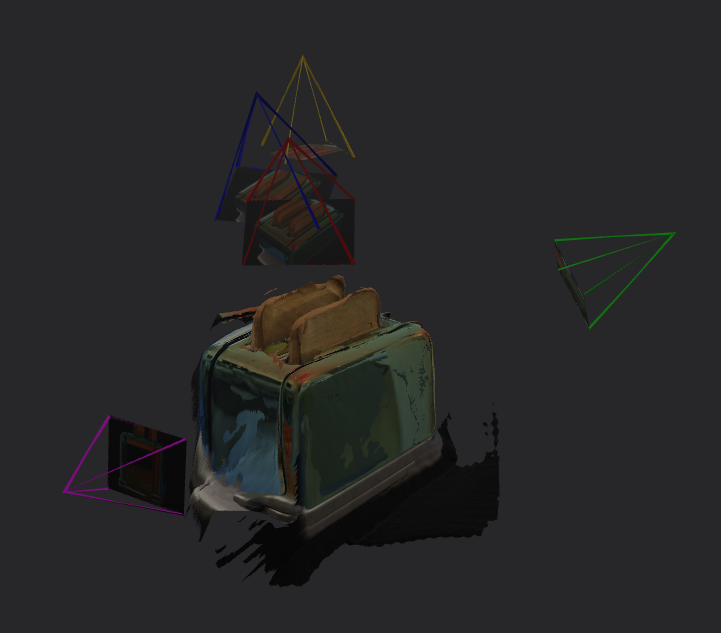

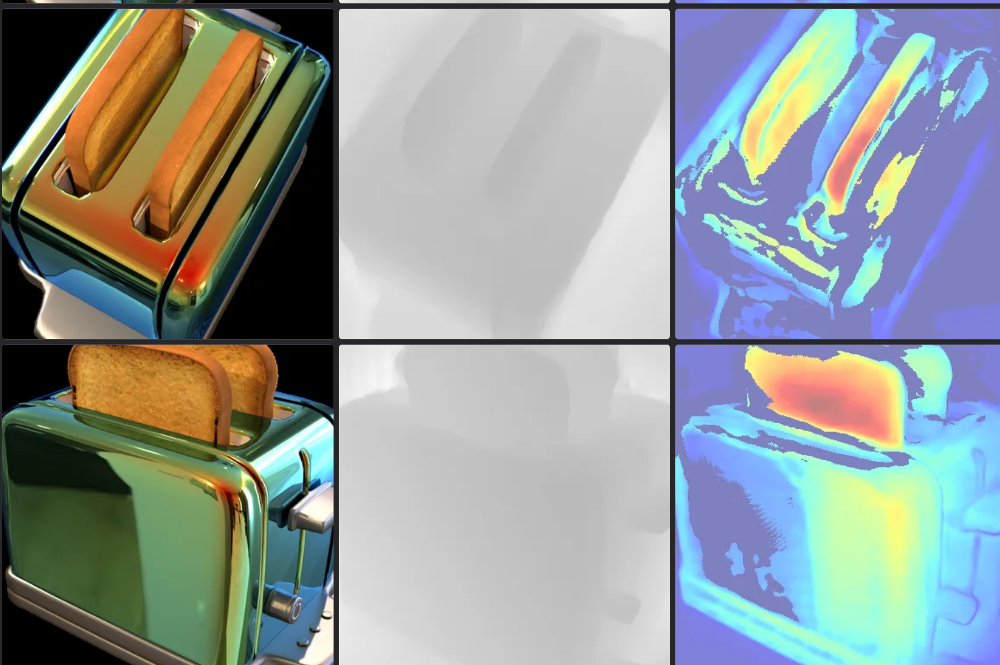

#### Using trained weights of DUSt3R 224 from scratch by me:

In [20]:
%cd /PKN/study_projects/cvg_bern/task_2/dust3r
!python demo.py --weights /PKN/study_projects/cvg_bern/task_2/dust3r/checkpoints/checkpoint-best.pth

[WinError 3] The system cannot find the path specified: '/PKN/study_projects/cvg_bern/task_2/dust3r'
e:\study_projects\cvg_bern\task_2\co3d\co3d


python: can't open file 'e:\study_projects\cvg_bern\task_2\co3d\co3d\demo.py': [Errno 2] No such file or directory


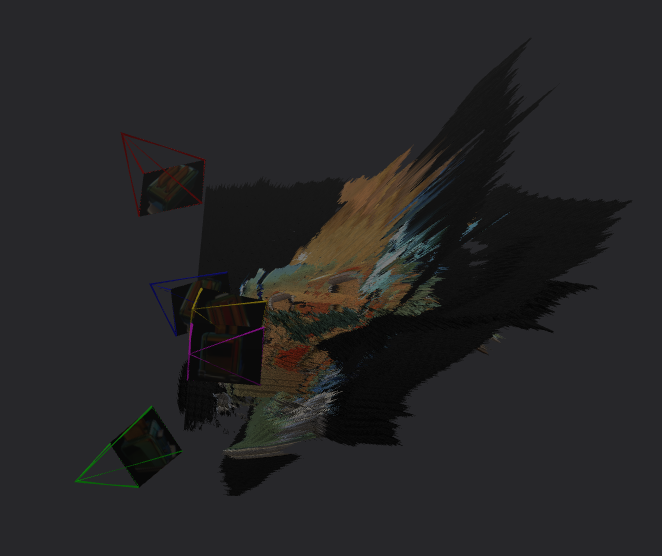

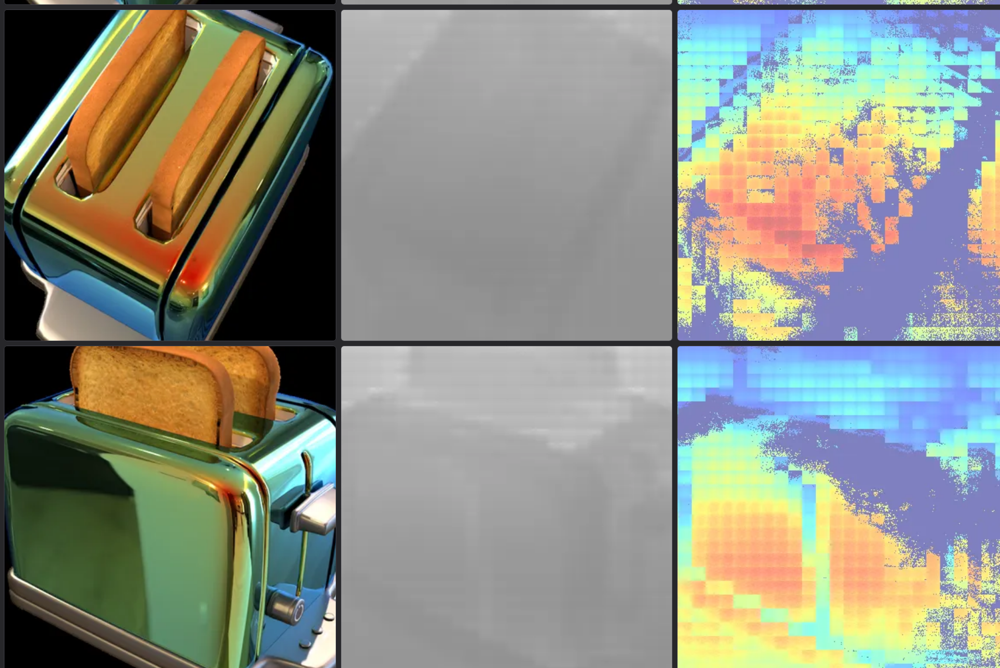

From visulizations it is evident that this training for just few epochs and on just few scenes is not enough for model to generalize well.

#### Comparison with 3D Gaussian Splatting

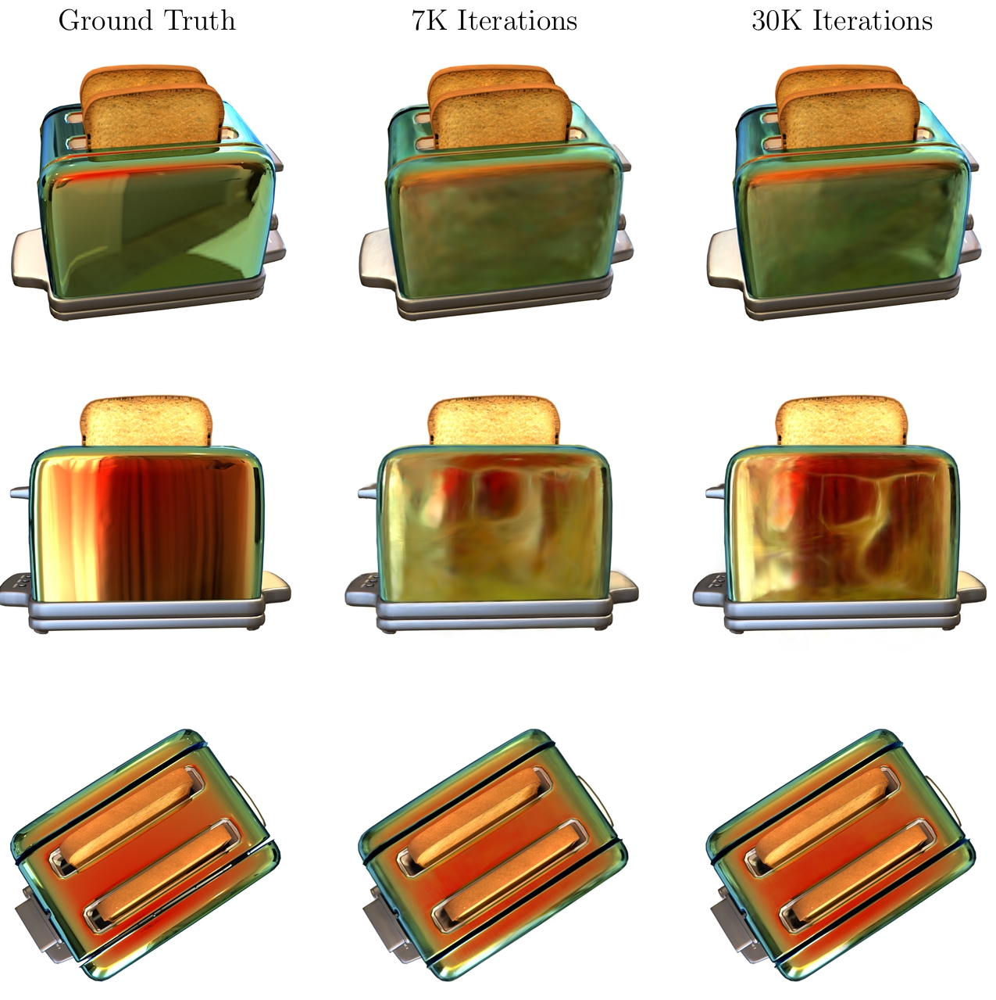

### Observations

Vanilla 3D Gaussian splatting able to learn the geometry and complex appearance of the scene.  
On the other we can see DUSt3R also perfoms well and reconstuct the geometry without needing to input camera parameters.   
We can conclude that combination of both of these methods will be game changer in 3D AI. 